# Машинное обучение, ФКН ВШЭ

# Практическое задание 10. Обучение без учителя.

## Общая информация
Дата выдачи: 26.03.2025

Мягкий дедлайн: 13.04.2025 23:59 MSK

Жёсткий дедлайн: 17.04.2025 23:59 MSK

## Оценивание и штрафы

Каждая из задач имеет определенную «стоимость» (указана в скобках около задачи).

Сдавать задание после указанного срока сдачи нельзя.

Задание выполняется самостоятельно. «Похожие» решения считаются плагиатом и все задействованные студенты (в том числе те, у кого списали) не могут получить за него больше 0 баллов (подробнее о плагиате см. на странице курса). Если вы нашли решение какого-то из заданий (или его часть) в открытом источнике, необходимо указать ссылку на этот источник в отдельном блоке в конце вашей работы (скорее всего вы будете не единственным, кто это нашел, поэтому чтобы исключить подозрение в плагиате, необходима ссылка на источник).

Неэффективная реализация кода может негативно отразиться на оценке.

## Формат сдачи
Задания сдаются через систему anytask. Посылка должна содержать:
* Ноутбук homework-practice-10-Username.ipynb

Username — ваша фамилия на латинице

## О задании

В этом задании мы посмотрим на несколько алгоритмов кластеризации и применим их к географическим и текстовым данным. Также мы подробно остановимся на тематическом моделировании текстов, задаче обучения представлений и в каком-то смысле поработаем с semi-supervised learning.



In [466]:
import pandas as pd
import numpy as np

np.random.seed(0xFFFFFFF)

**Задание 0 (1e-100 балла)**. Опишите свои ощущения от домашки по ЕМ-алгоритму (можно картинкой или мемом).

<img src="/Users/polina/Desktop/Screenshot 2025-04-13 at 21.06.05.png"  style="height: 100px; width:100px;"/>

## Часть 1. Кластеризация автобусных остановок

В этом задании мы сравним разные алгоритмы кластеризации для данных об автобусных остановках Москвы.

**Задание 1.1 (1 балл).** Реализуйте алгоритм спектральной кластеризации, который упоминался на лекции. Для этого разберитесь с кодом шаблона, данного ниже, и допишите недостающую функцию. Напомним, что для графа с матрицей смежности $W = \{w_{ij}\}_{i, j = 1 \dots \ell}$ лапласиан определяется как:

$$
L = D - W,
$$

где $D = \text{diag}(d_1, ..., d_{\ell}), d_i = \sum_{j=1}^{\ell} w_{ij}$.

In [467]:
from sklearn.base import ClusterMixin
from sklearn.cluster import KMeans
from scipy.linalg import eigh


class GraphClustering(ClusterMixin):
    def __init__(self, n_clusters=8, n_components=None, **kwargs):
        '''
        Spectral clustering algorithm
        param n_clusters: number of clusters to form
        param n_components: number of eigenvectors to use
        '''

        if n_components is None:
            n_components = n_clusters

        self.n_components = n_components
        self.kmeans = KMeans(n_clusters=n_clusters, **kwargs)

    def fit_predict(self, X, y=None):
        '''
        Perform spectral clustering from graph adjacency matrix
        and return vertex labels.
        param X: (n_samples, n_samples) - graph adjacency matrix
        return: (n_samples, ) - vertex labels
        '''

        eigenvectors = self._generate_eigenvectors(X)
        labels = self.kmeans.fit_predict(eigenvectors[:, 1:])
        return labels

    def _generate_eigenvectors(self, X):
        '''
        Compute eigenvectors for spectral clustering
        param X: (n_samples, n_samples) - graph adjacency matrix
        return: (n_samples, n_components) - eigenvectors
        '''

        degrees = np.sum(X, axis=1)
        D = np.diag(degrees)
        L = D - X
        _, eigenvectors = eigh(L)
        return eigenvectors[:, :self.n_components]

Перед тем, как переходить к следующему заданию, протестируйте свое решение.

In [468]:
n_blocks, n_vertices = 10, 1000
block_vertices = n_vertices // n_blocks

X = np.zeros((n_vertices, n_vertices))
for i in range(0, n_vertices, block_vertices):
    X[i:i + block_vertices, i:i + block_vertices] = np.sqrt(i + 1)

graph_clustering = GraphClustering(n_clusters=n_blocks)
labels = graph_clustering.fit_predict(X)

true_labels = np.zeros(n_vertices, dtype=np.int32)
for i in range(0, n_vertices, block_vertices):
    true_labels[i:i + block_vertices] = labels[i]

assert labels.shape == (n_vertices, )
assert np.all(np.bincount(labels) == np.full(n_blocks, block_vertices))
assert np.all(labels == true_labels)

Теперь можем приступить к работе с реальными данными. Скачайте файл с данными об остановках общественного транспорта **в формате .xlsx** по [ссылке](https://data.mos.ru/opendata/download/60464/1/201) (так гарантированно не возникнет проблем с парсингом файла) и загрузите таблицу в ноутбук. Альтернативная ссылка: [отсюда](https://disk.yandex.ru/i/J0HlcDXd_KyIeg). Для удобства визуализации мы будем работать только с остановками в ЦАО.

In [605]:
data = pd.read_excel('/Users/polina/Downloads/transport.xlsx')
data = data[data.AdmArea_en == "Czentral`ny'j administrativny'j okrug"]
data = data.reset_index()
data.head()

,index,ID_en,Name_en,Longitude_WGS84_en,Latitude_WGS84_en,Street_en,AdmArea_en,District_en,RouteNumbers_en,StationName_en,Direction_en,Pavilion_en,OperatingOrgName_en,EntryState_en,global_id,geoData
0,278,347,"«2-й Лесной пер.», улица Бутырский Вал (347)",37.586584,55.782106,улица Бутырский Вал,Czentral`ny'j administrativny'j okrug,Tverskoj rajon,АТ18; А12; АТ56; АТ78,2-й Лесной пер.,NaN,да,ГУП «Мосгортранс»,active,889085436,NaN
1,279,349,"«Ул. Сущевский Вал», Новослободская улица (349)",37.590714,55.790630,Новослободская улица,Czentral`ny'j administrativny'j okrug,Tverskoj rajon,АТ47; АМ10; АТ3; АТ56; АТ78,Ул. Сущевский Вал,NaN,да,ГУП «Мосгортранс»,active,889085437,NaN
2,355,479,"«Стадион Лужники (южн.) (пос.)», улица Лужники...",37.565972,55.714265,улица Лужники,Czentral`ny'j administrativny'j okrug,rajon Xamovniki,А64; А216; А809; АС12; А255; АБК; АТ79,Стадион Лужники (южн.) (пос.),NaN,да,ГУП «Мосгортранс»,active,889085549,NaN
3,356,480,"«Спортзал Дружба», Лужнецкая набережная (480)",37.570191,55.712504,Лужнецкая набережная,Czentral`ny'j administrativny'j okrug,rajon Xamovniki,А64; А216; А809; АС12; А255; АБК; АТ79,Спортзал Дружба,NaN,да,ГУП «Мосгортранс»,active,889085550,NaN
4,357,481,"«Лужнецкая наб.», Лужнецкая набережная (481)",37.574559,55.713770,Лужнецкая набережная,Czentral`ny'j administrativny'j okrug,rajon Xamovniki,А64; А216; А809; АС12; А255; АБК; АТ79,Лужнецкая наб.,NaN,да,ГУП «Мосгортранс»,active,889085551,NaN


Воспользуемся библиотекой `folium` для визуализации данных.

In [470]:
import folium

map = folium.Map([55.75215, 37.61819], zoom_start=12)
for id, row in data.iterrows():
    folium.Circle([row.Latitude_WGS84_en, row.Longitude_WGS84_en],
                  radius=10).add_to(map)
map

**Задание 1.2 (1 балл).** Попробуем построить граф, в котором вершинами будут остановки. Как вы уже могли заметить, для каждой остановки указаны номера маршрутов, проходящих через неё. Логично соединить ребрами соседние остановки каждого маршрута. Однако мы не знаем, в каком порядке автобусы объезжают остановки. Но мы можем применить эвристический алгоритм, который восстановит нам порядок маршрутов:

* Для каждого маршрута выделим список всех остановок, через которые он проходит.
* Выберем начальную остановку маршрута как точку, наиболее удаленную от всех остальных остановок этого маршрута.
* Каждую следующую точку маршрута будем выбирать как самую близкую из оставшихся точек (не включенных в маршрут ранее).

Фактически, у нас получается жадное решение задачи коммивояжера. Когда мы отсортировали маршруты, можем построить по ним граф. Будем строить его по таким правилам:

* Между двумя остановками будет ребро, если они являются соседними хотя бы на одном маршруте. Вес ребра равен числу маршрутов, на которых остановки являются соседними.
* В графе не будет петель (то есть у матрицы смежности будет нулевая диагональ).

Реализуйте предложенный способ построения графа. Для этого рекомендуется воспользоваться шаблонами, приведенными ниже.

In [471]:
from math import radians, cos, sin, asin, sqrt

def haversine_calc(lon1, lat1, lon2, lat2):
    lon1, lat1, lon2, lat2 = radians(lon1), radians(lat1), radians(lon2), radians(lat2)
    dlon = lon2 - lon1
    dlat = lat2 - lat1
    a = sin(dlat/2)**2 + cos(lat1) * cos(lat2) * sin(dlon/2)**2
    c = 2 * asin(sqrt(a))
    return c * 6371 

In [472]:
from collections import defaultdict

def get_routes(data):
    '''
    Accumulate routes from raw data
    param data: pd.DataFrame - public transport stops data
    return: dict - unsorted stops ids for each route,
                   e.g. routes['A1'] = [356, 641, 190]
    '''
    routes = defaultdict(list) 
    for _, row in data.iterrows():
        id = row['ID_en']
        route_all = str(row['RouteNumbers_en']).split(';')
        for route_num in route_all:
            route_num_cleaned = route_num.strip()
            if id not in routes[route_num_cleaned]:
                routes[route_num_cleaned].append(id)
    return dict(routes)


def sort_routes(data, routes):
    '''
    Sort routes according to the proposed algorithm
    param data: pd.DataFrame - public transport stops data
    param routes: dict - unsorted stops ids for each route
    return: dict - sorted stops ids for each route
    '''

    sorted_routes = {}
    data_indexed = data.set_index('ID_en')
    stop_coords = data_indexed[['Latitude_WGS84_en', 'Longitude_WGS84_en']].to_dict('index')
    for route_num, stop_ids in routes.items():
        if len(stop_ids) < 2:
            sorted_routes[route_num] = stop_ids
            continue

        max_total_distance = -1
        start_stop_id = -1

        valid_stop_ids_in_route = [s for s in stop_ids if s in stop_coords] 
        if len(valid_stop_ids_in_route) < 2: 
            sorted_routes[route_num] = stop_ids
            continue

        for current_stop_id in valid_stop_ids_in_route:
            total_distance = 0
            lat1, lon1 = stop_coords[current_stop_id]['Latitude_WGS84_en'], stop_coords[current_stop_id]['Longitude_WGS84_en']
            for other_stop_id in valid_stop_ids_in_route:
                if current_stop_id == other_stop_id:
                    continue
                lat2, lon2 = stop_coords[other_stop_id]['Latitude_WGS84_en'], stop_coords[other_stop_id]['Longitude_WGS84_en']
                total_distance += haversine_calc(lon1, lat1, lon2, lat2)

            if total_distance > max_total_distance:
                max_total_distance = total_distance
                start_stop_id = current_stop_id

        if start_stop_id == -1:
            sorted_routes[route_num] = stop_ids
            continue
        
        current_sorted_route = [start_stop_id]
        remaining_stops = set(valid_stop_ids_in_route) 
        remaining_stops.remove(start_stop_id)

        while remaining_stops:
            last_stop_id = current_sorted_route[-1]
            lat1, lon1 = stop_coords[last_stop_id]['Latitude_WGS84_en'], stop_coords[last_stop_id]['Longitude_WGS84_en']
            min_distance = float('inf')
            nearest_stop_id = -1
            for next_stop_id in remaining_stops:
                lat2, lon2 = stop_coords[next_stop_id]['Latitude_WGS84_en'], stop_coords[next_stop_id]['Longitude_WGS84_en']
                distance = haversine_calc(lon1, lat1, lon2, lat2)
                if distance < min_distance:
                    min_distance = distance
                    nearest_stop_id = next_stop_id

            if nearest_stop_id == -1:
                print(f"Предупреждение: Не удалось найти ближайшую остановку к {last_stop_id} на маршруте {route_num}. Прерывание сортировки для этого маршрута.")
                break

            current_sorted_route.append(nearest_stop_id)
            remaining_stops.remove(nearest_stop_id)

        sorted_routes[route_num] = current_sorted_route
    return sorted_routes

def get_adjacency_matrix(data, sorted_routes):
    '''
    Compute adjacency matrix for sorted routes
    param data: pd.DataFrame - public transport stops data
    param sorted_routes: dict - sorted stops ids for each route
    return: (n_samples, n_samples) - graph adjacency matrix
    '''
    all_stop_ids = data['ID_en'].unique().tolist()
    n_samples = len(all_stop_ids)
    id_to_index = {stop_id: i for i, stop_id in enumerate(all_stop_ids)}
    adj_matrix = np.zeros((n_samples, n_samples), dtype=int)

    for _, stop_ids in sorted_routes.items(): 
        for i in range(len(stop_ids) - 1):
            stop_a_id = stop_ids[i]
            stop_b_id = stop_ids[i+1]
            if stop_a_id in id_to_index and stop_b_id in id_to_index:
                idx_a = id_to_index[stop_a_id]
                idx_b = id_to_index[stop_b_id]
                adj_matrix[idx_a, idx_b] += 1
                adj_matrix[idx_b, idx_a] += 1

    return adj_matrix

In [473]:
routes = get_routes(data)
sorted_routes = sort_routes(data, routes)
adjacency_matrix = get_adjacency_matrix(data, sorted_routes)

Проверим, что маршруты получились адекватными. Для этого нарисуем их на карте.

In [474]:
rdata = data.set_index('ID_en')

In [475]:
map = folium.Map([55.75215, 37.61819], zoom_start=12)
for route_id in np.random.choice(list(sorted_routes.keys()), size=5):
    coords = rdata.loc[
        sorted_routes[route_id],
        ['Latitude_WGS84_en', 'Longitude_WGS84_en']
    ].values.tolist()
    folium.vector_layers.PolyLine(coords).add_to(map)

map

**Задание 1.3 (0 баллов)**. Реализуйте функцию `draw_clustered_map`, которая рисует карту центра Москвы с кластерами остановок, раскрашенными в разные цвета.

In [476]:
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

def draw_clustered_map(data, labels):
    '''
    Create map with coloured clusters
    param data: pd.DataFrame - public transport stops data
    param labels: (n_samples, ) - cluster labels for each stop
    return: folium.Map - map with coloured clusters
    '''
    m = folium.Map(location=[55.75215, 37.61819], zoom_start=12) 
    labels = pd.Series(labels).reindex(data.index)
    unique_labels = np.unique(labels)
    cluster_labels = unique_labels[unique_labels != -1] 
    n_clusters = len(cluster_labels)

    if n_clusters == 0:
        cluster_colors_map = {-1: '#808080'} 
        noise_color = '#808080'
    else:
        if n_clusters <= 10:
            cmap = plt.colormaps.get_cmap('tab10')
            colors = [mcolors.to_hex(cmap(i)) for i in range(n_clusters)]
        elif n_clusters <= 20:
            cmap = plt.colormaps.get_cmap('tab20')
            colors = [mcolors.to_hex(cmap(i)) for i in range(n_clusters)]
        else:
            cmap = plt.colormaps.get_cmap('viridis')
            colors = [mcolors.to_hex(cmap(i / (n_clusters - 1))) for i in range(n_clusters)]
            if n_clusters == 1:
                 colors = [mcolors.to_hex(cmap(0.5))]

        cluster_colors_map = {label: color for label, color in zip(cluster_labels, colors)}
        noise_color = '#808080' 
        cluster_colors_map[-1] = noise_color 

    for idx, row in data.iterrows():
        label = labels.loc[idx] if isinstance(labels, pd.Series) else labels[idx]
        color = cluster_colors_map.get(label, noise_color)
        folium.CircleMarker(
            location=[row['Latitude_WGS84_en'], row['Longitude_WGS84_en']],
            radius=3,  
            color=color,
            fill=True,
            fill_color=color,
            fill_opacity=0.7,
            popup=f"Cluster: {label}" 
        ).add_to(m)

    return m

**Задание 1.4 (1.5 балла)**. Примените алгоритмы кластеризации и подберите гиперпараметры так, чтобы кластеры получились осмысленными (нет такого, что все принадлежит одному кластеру или большая часть точек это шум):
- `sklearn.clustering.KMeans` - `n_clusters`
- `sklearn.clustering.DBSCAN` - `eps`
- ваш `SpectralClustering` - `n_clusters` и `n_components`

Для ряда алгоритмов, в частности DBSCAN, подобрать оптимальные параметры может быть ой, как непросто. Чтобы помочь сохранить нервные клетки рекомендуется пользоваться метриками Intrinsic Evaluation для кластеризации. Для каждого алгоритма скорее всего придется брать разные метрики, а может быть оптимизировать сразу несколько.

Ваша задача - выбрать подходящую метрику, можно взять что-то из списка ниже, можно спросить у гугла. Применить GridSearch, `optuna` или `hyperopt` и желательно завернуть отбор параметров в функцию, пригодится далее

1. $
   \text{Calinski-Harabasz Index} \in [0, \inf] = \frac{\sum_{i=1}^k BCSS_i/(k-1)}{\sum_{i=1}^k WCSS_i/(n-k)} = \frac{\sum_{i=1}^k n_i \| \mathbf{c}_i - \mathbf{c} \|^2/(k-1)}{\sum_{i=1}^k \sum_{\mathbf{x} \in C_i} \|\mathbf{x} - \mathbf{c}_i\|^2/(n-k)} \rightarrow max
   $
   - Отношение 1) расстояния от центра кластера до центра всех данных к 2) расстоянию от центра кластера до точки
   - Чем однороднее и дальше друг от друга кластеры, тем лучше
2. $
   \text{Silhouette Score} \in [0, 1] = \sum_i \frac{b_i - a_i}{\max(a_i, b_i)} \rightarrow max
   $
   - $a_i$ - среднее расстояние до точек внутри своего кластера
   - $b_i$ - среднее расстояние до точек из ближайшего кластера
   - Если в своем кластере точки близко - кластер плотный, идеальный вариант, скор равен 1, если свой кластер совпадает с соседним - кластеры неразделимы, скор равен нулю
   - Чем однороднее и разделимее кластеры, тем лучше
3. $\text{Davies-Bouldin Index} \in [0, inf] = \frac{1}{k} \sum_{i=1}^{k} \max_{j \neq i} \left( \frac{WCSS_i + WCSS_j}{d(c_i, c_j)} \right) \rightarrow min $
   - Отношение внутрикластерных расстояний к межкластерному расстоянию между двумя центрами
   - Если кластеры далеко друг от друга, но при этом однородные, скор наименьший
3. $\text{Elbow Method}$ - последовательное сравнение $WCSS$ из пункта 1 для разного числа параметров. Если уменьшение меньше определенного порога - останавливаемся, считаем это значение оптимальным

In [606]:
import optuna
from sklearn.cluster import KMeans, DBSCAN
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score
from sklearn.preprocessing import StandardScaler

coords_deg = data[['Latitude_WGS84_en', 'Longitude_WGS84_en']].values
coords_rad = np.radians(coords_deg)

In [677]:
def objective_kmeans(trial):
    n_clusters = trial.suggest_int('n_clusters', 6, 30) 
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    labels = kmeans.fit_predict(coords_rad)
    n_unique_labels = len(set(labels))
    if n_unique_labels <= 1:
        print(f"KMeans({n_clusters=}) -> Trivial clustering")
        return -1.0 
    score = calinski_harabasz_score(coords_rad, labels)
    return score 

def objective_dbscan(trial):
    eps = trial.suggest_float('eps', 1e-6, 1e-2, log=True)
    min_samples = trial.suggest_int('min_samples', 117, 400)
    dbscan = DBSCAN(eps=eps, min_samples=min_samples, metric='haversine') 
    labels = dbscan.fit_predict(coords_rad)
    non_noise_mask = (labels != -1)
    labels_core = labels[non_noise_mask]
    n_clusters_found = len(set(labels_core))
    labels_non_noise = labels[non_noise_mask]
    coords_rad_non_noise = coords_rad[non_noise_mask]
    if n_clusters_found < 2 or len(coords_rad_non_noise) == 0:
        return -1.0
    score = silhouette_score(coords_rad_non_noise, labels_non_noise, metric='haversine')
    return score

def objective_spectral(trial):
    n_clusters = trial.suggest_int('n_clusters', 6, 15)
    n_components = trial.suggest_int('n_components', n_clusters, n_clusters*3)
    clusterer = GraphClustering(n_clusters=n_clusters, n_components=n_components)
    labels = clusterer.fit_predict(adjacency_matrix)
    unique_labels = np.unique(labels)
    if len(unique_labels) < 2 or len(unique_labels) > len(coords_rad) - 1:
        return -1
    
    score = davies_bouldin_score(coords_rad, labels)
    return score

In [585]:
study_kmeans = optuna.create_study(direction='maximize')
study_kmeans.optimize(objective_kmeans, n_trials=200, show_progress_bar=True)
print(f"Best KMeans params: {study_kmeans.best_params}, Best calinski_harabasz: {study_kmeans.best_value:.4f}")

Best trial: 19. Best value: 1626.92: 100%|██████████| 200/200 [00:01<00:00, 105.69it/s]

Best KMeans params: {'n_clusters': 27}, Best calinski_harabasz: 1626.9239


In [678]:
study_dbscan = optuna.create_study(direction='maximize')
study_dbscan.optimize(objective_dbscan, n_trials=500, show_progress_bar=True)
print(f"Best DBSCAN params: {study_dbscan.best_params}, Best Silhouette: {study_dbscan.best_value:.4f}")

Best trial: 242. Best value: 0.523324: 100%|██████████| 500/500 [00:06<00:00, 81.10it/s]

Best DBSCAN params: {'eps': 0.00021002601805939053, 'min_samples': 117}, Best Silhouette: 0.5233


In [591]:
study_spectral = optuna.create_study(direction='minimize')
study_spectral.optimize(objective_spectral, n_trials=100, show_progress_bar=True)
print(f"Best Spectral params: {study_spectral.best_params}, Best davies_bouldin: {study_spectral.best_value:.4f}")

Best trial: 2. Best value: 0.982307: 100%|██████████| 100/100 [01:31<00:00,  1.09it/s]

Best Spectral params: {'n_clusters': 8, 'n_components': 13}, Best davies_bouldin: 0.9823


Визуализируйте результат кластеризации с помощью функции `draw_clustered_map`.

In [594]:
best_kmeans_params = study_kmeans.best_params
kmeans_final = KMeans(n_clusters=best_kmeans_params['n_clusters'], n_init='auto', random_state=42)
labels_kmeans_best = kmeans_final.fit_predict(coords_rad)
draw_clustered_map(data, labels_kmeans_best)

In [679]:
best_dbscan_params = study_dbscan.best_params
dbscan_final = DBSCAN(eps=best_dbscan_params['eps'], min_samples=best_dbscan_params['min_samples'], metric='haversine')
labels_dbscan_best = dbscan_final.fit_predict(coords_rad)
draw_clustered_map(data, labels_dbscan_best)

In [680]:
n_clusters_ = len(set(labels_dbscan_best)) - (1 if -1 in labels_dbscan_best else 0)
n_noise_ = list(labels_dbscan_best).count(-1)
print(f'Estimated number of clusters: {n_clusters_}')
print(f'Estimated number of noise points: {n_noise_}')

Estimated number of clusters: 3
Estimated number of noise points: 456


In [592]:
best_spectral_params = study_spectral.best_params
spectral_final = GraphClustering(n_clusters=best_spectral_params['n_clusters'], n_components=best_spectral_params['n_components'], random_state=42)
labels_spectral_best = spectral_final.fit_predict(adjacency_matrix) 

draw_clustered_map(data, labels_spectral_best)

**Вопрос:** Чем отличаются разбиения на кластеры, получаемые разными алгоритмами? Какие плюсы и минусы есть у каждого алгоритма? Какой алгоритм кажется вам наиболее подходящим для кластеризации остановок?

**Ответ:** Спектральная кластеризация как будто выделяет отдельно именно районы и в меньшей степени маршруты по ним (из плюсов - хорошо собирает в большие кластеры, из минусов - частично теряет за счет этого специфику). KMeans как будто более выделяет именно сами маршруты (и точнее), но при этом слишокм сильно ориентируется на географическую близость между точками. DBSCAN много относит к шуму и выделяет слишком мало кластеров, которые являются очень большими (хотя что могла, уже поперебирала) - возможно, с более хорошими гиперпараметрами результат получился бы точным

Наиболее подходящим получается KMeans, он сохраняет специфику маршрутов, а не просто географию

## Часть 2. Тематическое моделирование текстов

В этой части мы познакомимся с одной из самых популярных задач обучения без учителя &mdash; с задачей тематического моделирования текстов. Допустим, нам доступна некоторая коллекция документов без разметки, и мы хотим автоматически выделить несколько тем, которые встречаются в документах, а также присвоить каждому документу одну (или несколько) тем. Фактически, мы будем решать задачу, похожую на кластеризацию текстов: отличие в том, что нас будет интересовать не только разбиение текстов на группы, но и выделение ключевых слов, определяющих каждую тему.

Мы будем работать с новостными статьями BBC за 2004-2005 годы. Скачайте данные по [ссылке](https://www.kaggle.com/hgultekin/bbcnewsarchive).

In [566]:
data = pd.read_csv('bbc-news-data.csv', sep='\t')
data.sample(5)

,category,filename,title,content
1717,sport,405.txt,Ireland 19-13 England,Ireland consigned England to their third stra...
1262,politics,367.txt,"UK heading wrong way, says Howard",Tony Blair has had the chance to tackle the p...
2175,tech,352.txt,Slow start to speedy net services,Faster broadband in the UK is becoming a real...
31,business,032.txt,Japanese banking battle at an end,Japan's Sumitomo Mitsui Financial has withdra...
1215,politics,320.txt,Hague's six-figure earnings shown,The rewards of leaving front-bench politics a...


Как вы могли заметить, данные уже содержат разметку по тематике (колонка category). В этой части мы забудем, что она есть, и будем работать только с текстовыми данными. Проведем предобработку текста, состоящую из следующих пунктов:

* Объединим заголовок и содержание статьи в одно поле.
* Приведем текст к нижнему регистру, разобьем его на токены.
* Оставим только буквенные слова (удалив, таким образом, пунктуацию и числа).
* Применим лемматизацию.
* Удалим стоп-слова.


In [567]:
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer

In [568]:
nltk.download('punkt')
nltk.download('wordnet')
nltk.download('stopwords')

stop_words = set(stopwords.words('english') + ['ha', 'wa', 'say', 'said'])
lemmatizer = WordNetLemmatizer()

[nltk_data] Downloading package punkt to /Users/polina/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to /Users/polina/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/polina/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [569]:
def preprocess(text):
    text = list(filter(str.isalpha, word_tokenize(text.lower())))
    text = list(lemmatizer.lemmatize(word) for word in text)
    text = list(word for word in text if word not in stop_words)
    return ' '.join(text)

In [570]:
nltk.download('punkt_tab')

[nltk_data] Downloading package punkt_tab to
[nltk_data]     /Users/polina/nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!


True

In [571]:
data['raw_text'] = data.apply(lambda row: row.title + row.content, axis=1)
data['text'] = data.apply(lambda row: preprocess(row.raw_text), axis=1)

Для визуализации частот слов в текстах мы будем использовать [облака тегов](https://en.wikipedia.org/wiki/Tag_cloud).

In [572]:
from wordcloud import WordCloud

def draw_wordcloud(texts, max_words=1000, width=1000, height=500):
    wordcloud = WordCloud(background_color='white', max_words=max_words,
                          width=width, height=height)

    joint_texts = ' '.join(list(texts))
    wordcloud.generate(joint_texts)
    return wordcloud.to_image()

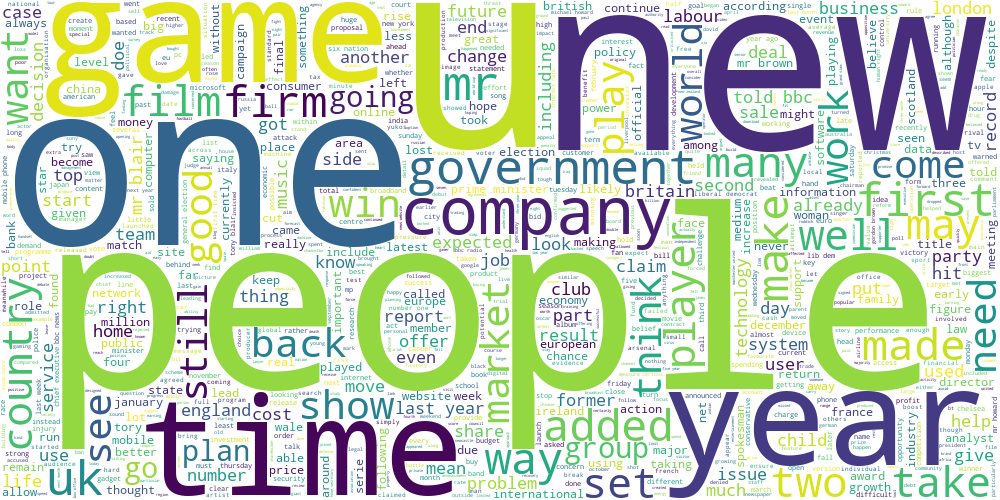

In [573]:
draw_wordcloud(data.text)

**Задание 2.1 (1 балл).** Обучите алгоритм K-Means на tf-idf представлениях текстов. При обучении tf-idf векторайзера рекомендуется отбрасывать редко встречающиеся слова, а также воздержитесь от использования N-грамм. Возьмите не очень большое число кластеров, чтобы было удобно интерпретировать получившиеся темы (например, `n_clusters` = 8). Постройте облака тегов для текстов из разных кластеров.

In [574]:
from sklearn.feature_extraction.text import TfidfVectorizer

vectorizer = TfidfVectorizer(stop_words='english',
                             min_df=3,         
                             ngram_range=(1, 1)) 

tfidf_matrix = vectorizer.fit_transform(data['text'])
print(f"TF-IDF shape: {tfidf_matrix.shape}") 


TF-IDF shape: (2225, 10792)


In [575]:
n_clusters = 8 
kmeans = KMeans(n_clusters=n_clusters,random_state=42,n_init='auto') 
kmeans.fit(tfidf_matrix)
labels = kmeans.labels_
data['cluster'] = labels

word cloud for cluster 0 (176 documents)


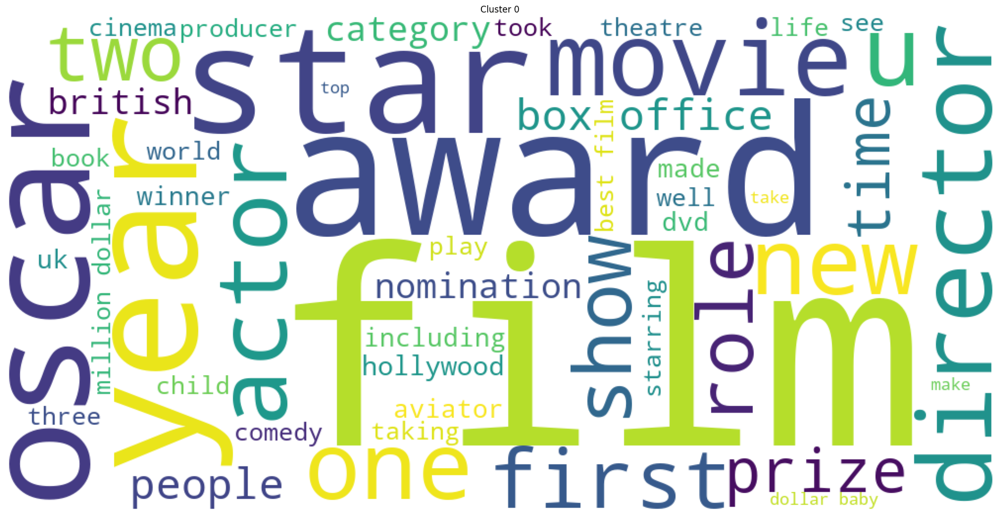

word cloud for cluster 1 (131 documents)


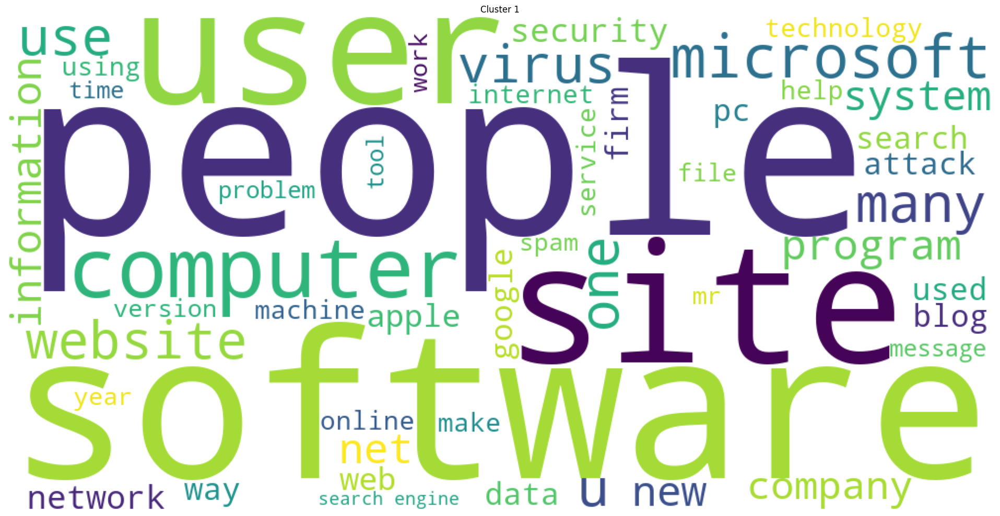

word cloud for cluster 2 (363 documents)


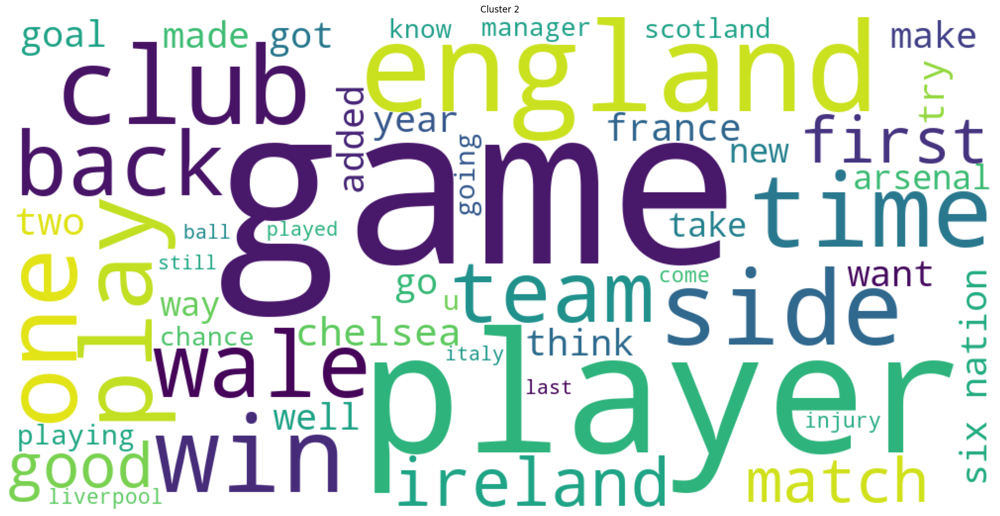

word cloud for cluster 3 (196 documents)


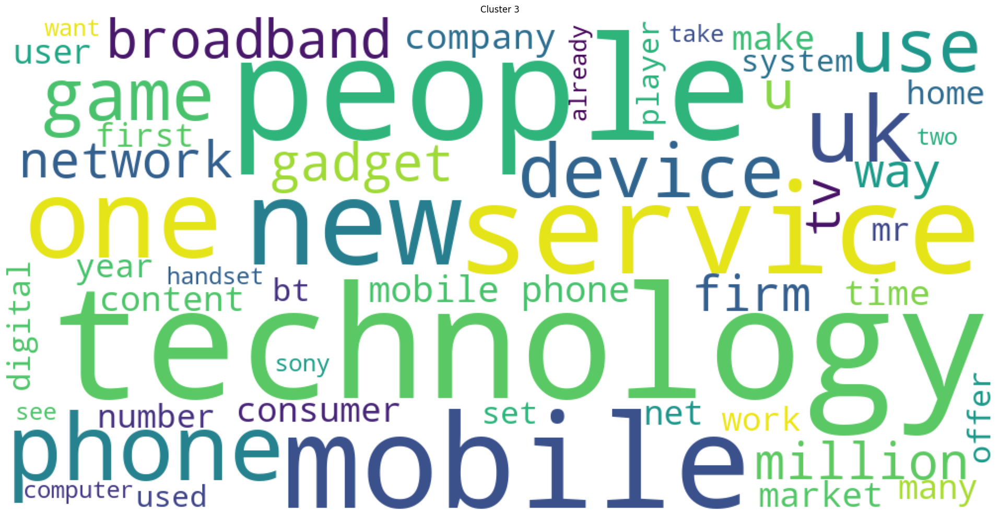

word cloud for cluster 4 (405 documents)


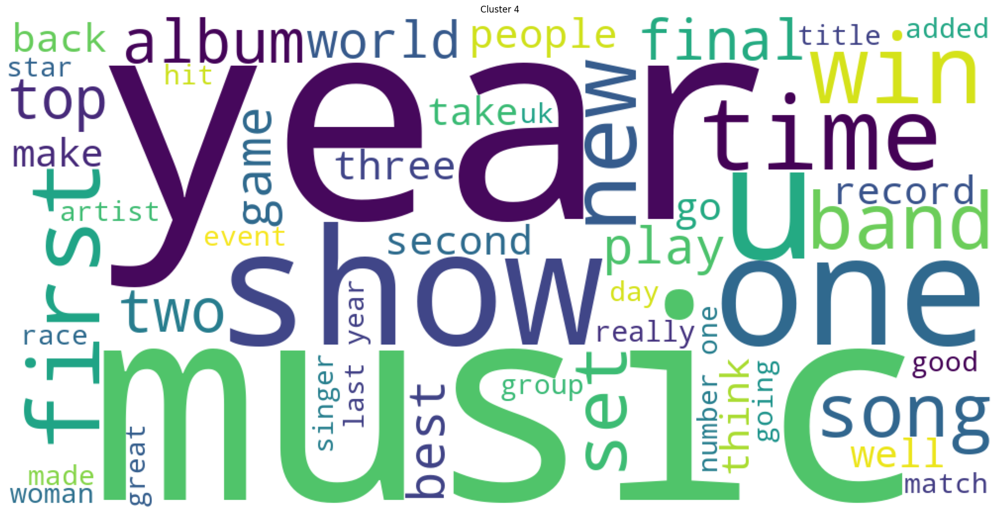

word cloud for cluster 5 (273 documents)


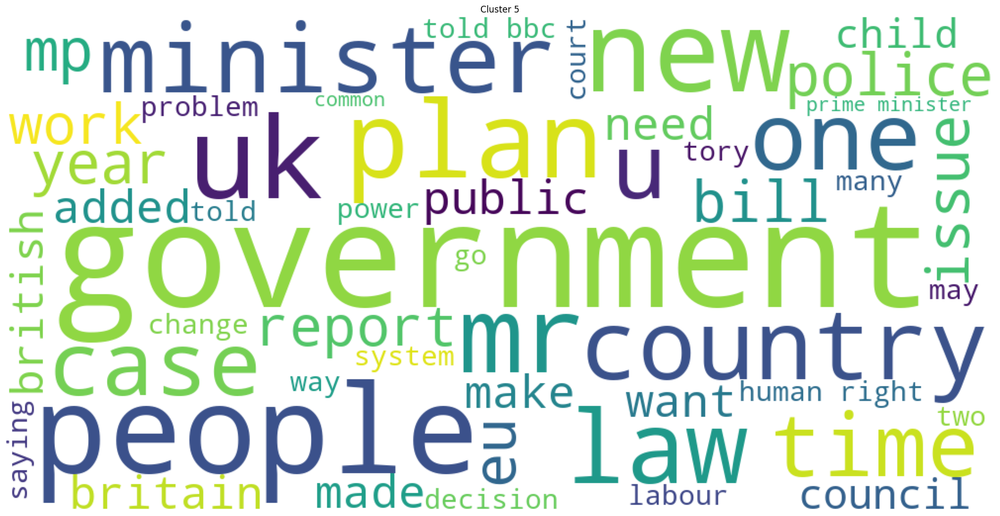

word cloud for cluster 6 (501 documents)


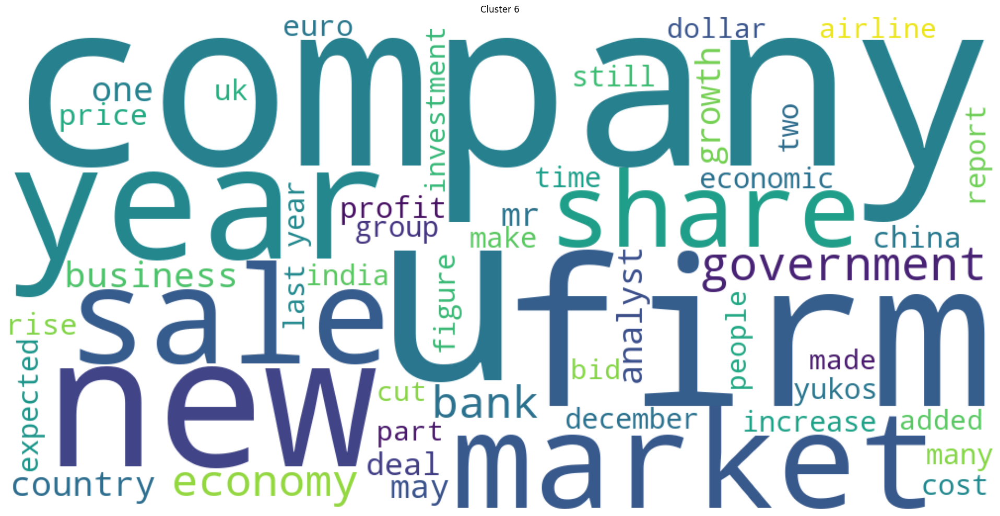

word cloud for cluster 7 (180 documents)


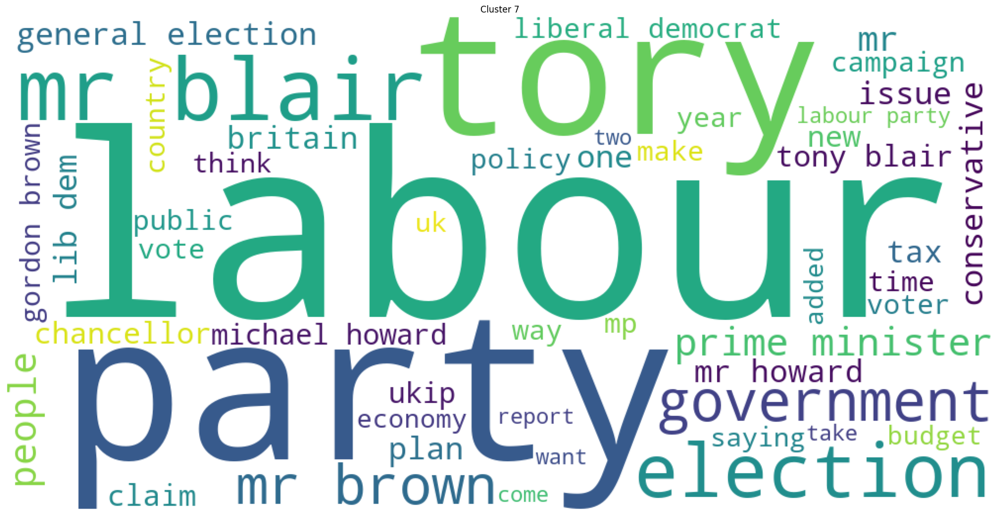

In [576]:
for i in range(n_clusters):
    cluster_texts = data[data['cluster'] == i]['text']
    print(f"word cloud for cluster {i} ({len(cluster_texts)} documents)")
    plt.figure(figsize=(20, 10)) 
    wordcloud_image = draw_wordcloud(cluster_texts, max_words=50) 
    plt.imshow(wordcloud_image)
    plt.title(f'Cluster {i}')
    plt.axis('off')
    plt.tight_layout() 
    plt.show()

Получились ли темы интерпретируемыми? Попробуйте озаглавить каждую тему.

**Ответ:** Темы получились вполне себе интерпретируемыми, судя по облакам тегов - попробую озаглавить

- тема 0: фильмы
- тема 1: software and security
- тема 2: спорт 
- тема 3: технологии
- тема 4: музыка
- тема 5: национальное и мировое регулирование 
- тема 6: бизнес
- тема 7: политика (выборы)

**Задание 2.2 (0.5 балла).** Попробуем другой способ выделить ключевые слова для каждой темы. Помимо непосредственного разбиения объектов алгоритм K-Means получает центр каждого кластера. Попробуйте взять центры кластеров и посмотреть на слова, для которых значения соответствующих им признаков максимальны.

In [577]:
cluster_centers = kmeans.cluster_centers_
feature_names = vectorizer.get_feature_names_out()

top_n = 10
print(f"\nTop {top_n} words per cluster:")

for i in range(kmeans.n_clusters):
    print(f"Cluster {i}:")
    center_vector = cluster_centers[i]
    top_indices = np.argsort(center_vector)[:-top_n-1:-1]
    top_words = [feature_names[index] for index in top_indices]
    top_scores = center_vector[top_indices]
    for word, score in zip(top_words, top_scores):
        print(f"  - {word} ({score:.4f})")
    print()



Top 10 words per cluster:
Cluster 0:
  - film (0.1980)
  - award (0.0852)
  - best (0.0664)
  - oscar (0.0572)
  - actor (0.0548)
  - star (0.0429)
  - festival (0.0419)
  - director (0.0386)
  - actress (0.0382)
  - movie (0.0348)

Cluster 1:
  - software (0.0747)
  - site (0.0718)
  - user (0.0654)
  - virus (0.0589)
  - microsoft (0.0577)
  - search (0.0562)
  - computer (0.0559)
  - program (0.0547)
  - security (0.0461)
  - people (0.0420)

Cluster 2:
  - game (0.0768)
  - england (0.0485)
  - player (0.0421)
  - club (0.0362)
  - wale (0.0308)
  - rugby (0.0303)
  - chelsea (0.0303)
  - cup (0.0284)
  - ireland (0.0282)
  - team (0.0280)

Cluster 3:
  - mobile (0.0964)
  - phone (0.0840)
  - technology (0.0707)
  - digital (0.0525)
  - people (0.0523)
  - broadband (0.0520)
  - service (0.0492)
  - device (0.0432)
  - gadget (0.0427)
  - music (0.0417)

Cluster 4:
  - music (0.0319)
  - band (0.0290)
  - world (0.0273)
  - album (0.0270)
  - year (0.0269)
  - best (0.0223)
  - o

Согласуются ли полученные слова с облаками тегов из прошлого задания?

**Ответ:** да, согласуются и в большинстве своем повторяют то, что получалось в облаках тегов

**Задание 2.3 (1.5 балла).** В первой части мы сравнили три разных алгоритма кластеризации на географических данных. Проделаем то же самое для текстовых данных (в качестве признакого описания снова используем tf-idf). Получите три разбиения на кластеры с помощью алгоритмов K-Means, DBSCAN и спектральной кластеризации (на этот раз воспользуйтесь реализацией из `sklearn`). Для K-Means и спектральной кластеризации возьмите одинаковое небольшое число кластеров, подберите параметр `eps` метода DBSCAN так, чтобы получить приблизительно такое же число кластеров (подумайте, как это можно сделать)

Далее, обучите двухмерные t-SNE представления над tf-idf признаками текстов. Визуализируйте эти представления для каждого алгоритма, раскрасив каждый кластер своим цветом. Лучше всего расположить визуализации на одном графике на трех разных сабплотах. Не забудьте, что DBSCAN помечает некоторые точки как шумовые (можно раскрасить их в отдельный цвет).

In [578]:
from sklearn.cluster import KMeans, DBSCAN, SpectralClustering
from sklearn.neighbors import NearestNeighbors 

clusters_num = 8 
kmeans = KMeans(n_clusters=clusters_num, random_state=42, n_init='auto')
labels_kmeans = kmeans.fit_predict(tfidf_matrix)

In [579]:
spectral = SpectralClustering(n_clusters=clusters_num,
                              affinity='nearest_neighbors', 
                              n_neighbors=10, 
                              random_state=42,
                              n_init=10) 
labels_spectral = spectral.fit_predict(tfidf_matrix)

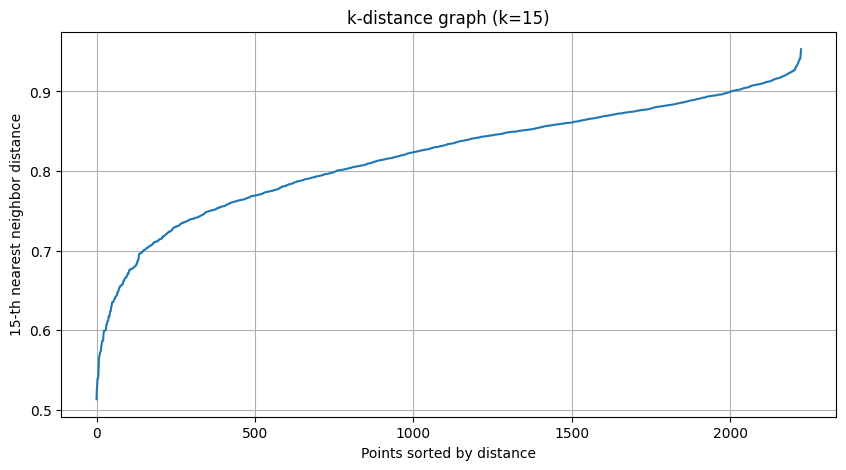

In [580]:
#eps можно подобрать по графику k-distance, и хоть он получился не очень убедительным, подобрать eps можно

min_samples = 15 

nn = NearestNeighbors(n_neighbors=min_samples, metric='cosine') 
nn.fit(tfidf_matrix)
distances, indices = nn.kneighbors(tfidf_matrix)

k_distances = distances[:, min_samples - 1]
k_distances_sorted = np.sort(k_distances)

plt.figure(figsize=(10, 5))
plt.plot(k_distances_sorted)
plt.title(f'k-distance graph (k={min_samples})') 
plt.xlabel("Points sorted by distance")
plt.ylabel(f"{min_samples}-th nearest neighbor distance")
plt.grid(True)
plt.show()

In [581]:
estimated_eps = 0.751
#estimated_eps = 0.75

dbscan = DBSCAN(eps=estimated_eps, min_samples=min_samples, metric='cosine') 
labels_dbscan = dbscan.fit_predict(tfidf_matrix)
n_clusters_dbscan = len(set(labels_dbscan)) - (1 if -1 in labels_dbscan else 0)
n_noise_dbscan = np.sum(labels_dbscan == -1)
print(f"  - Found {n_clusters_dbscan} clusters (target was approx. {8})")
print(f"  - Found {n_noise_dbscan} noise points ({n_noise_dbscan / tfidf_matrix.shape[0] * 100:.1f}%)")

  - Found 8 clusters (target was approx. 8)
  - Found 1189 noise points (53.4%)


In [582]:
all_labels = {
    'KMeans': labels_kmeans,
    'Spectral': labels_spectral,
    'DBSCAN': labels_dbscan
}

In [583]:
from sklearn.manifold import TSNE

tsne = TSNE(n_components=2,
            perplexity=30, 
            max_iter=1000,   
            learning_rate='auto',
            init='random',      
            random_state=42,
            metric='cosine') 

tsne_results = tsne.fit_transform(tfidf_matrix) 
print(f"t-SNE shape: {tsne_results.shape}") 

t-SNE shape: (2225, 2)


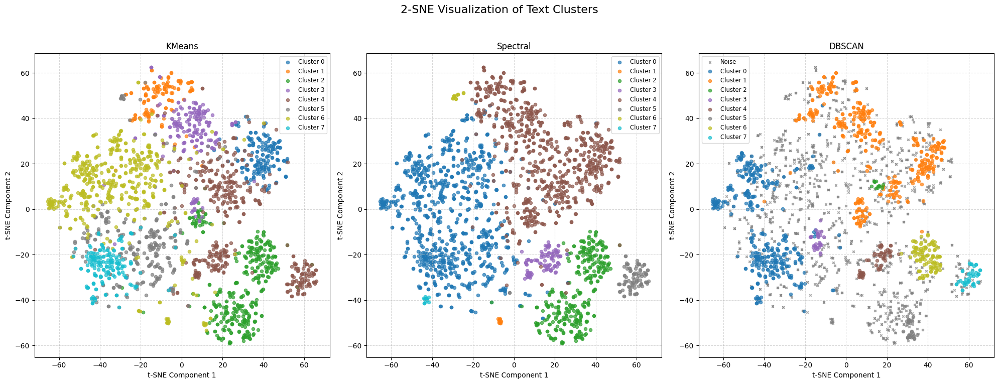

In [584]:
fig, axes = plt.subplots(1, 3, figsize=(20, 8)) 
fig.suptitle('2-SNE Visualization of Text Clusters', fontsize=16)

max_k = 0
for labels in all_labels.values():
    max_k = max(max_k, len(set(l for l in labels if l != -1)))

cmap = plt.colormaps.get_cmap('tab10')
colors = [mcolors.to_hex(cmap(i / max(1, max_k -1 ))) for i in range(max_k)] # Нормализация для непрерывных карт
noise_color = '#808080' 
color_map = {i: colors[i] for i in range(max_k)}
color_map[-1] = noise_color

for ax, (algo_name, labels) in zip(axes, all_labels.items()):
    unique_labels = np.unique(labels)
    for label in unique_labels:
        mask = (labels == label)
        color = color_map.get(label, noise_color) 
        label_text = f'Cluster {label}' if label != -1 else 'Noise'
        marker = 'o' if label != -1 else 'x' 
        size = 20 if label != -1 else 10    
        ax.scatter(tsne_results[mask, 0], tsne_results[mask, 1],
                   color=color,
                   label=label_text,
                   alpha=0.7,
                   s=size,
                   marker=marker)

    ax.set_title(f'{algo_name}')
    ax.set_xlabel("t-SNE Component 1")
    ax.set_ylabel("t-SNE Component 2")
    ax.grid(True, linestyle='--', alpha=0.5)
    ax.legend(loc='best', fontsize='small') 

plt.tight_layout(rect=[0, 0.03, 1, 0.95]) 
plt.show()

Прокомментируйте получившиеся результаты. Какой баланс кластеров получился у разных методов? Соотносятся ли визуализации для текстов с визуализациями для географических данных?

**Ответ:** Что-то баланс кластеров различается между алгоритмами конечно. Спектральная кластеризация выдяляет меньше больших классов, а некоторые у нее очень маленькие (справедливости ради, там, где они очень маленькие, и другие алгоритмы смущаются, а DBSCAN относит эти моменты к шуму). KMeans разделяет между собой те классы, которые спектральная кластеризация и DBSCAN отнесли к одному. Но глобально видно, например, что границы между классами у них похожи прямо, в основном различается размер

В географических данных кластеризация была сложнее и более шумная, но некоторые сходства имеются - в плане выделения конкретных зон, в чем алгоритмы в целом совпадали

**Задание 2.4 (1.5 балла).** Обучите модель латентного размещения Дирихле. Не забудьте, что она работает с мешком слов, а не с tf-idf признаками. Придумайте, как превратить распределение тем для текста в номер его кластера. Возьмите параметр `n_components` в 2-3 раза больше, чем число кластеров для K-Means.

In [435]:
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.decomposition import LatentDirichletAllocation

bow_vectorizer = CountVectorizer(min_df=3, 
                                 ngram_range=(1, 1)) 
bow_matrix = bow_vectorizer.fit_transform(data['text'])
print(f"Bag-of-Words matrix shape: {bow_matrix.shape}")

Bag-of-Words matrix shape: (2225, 10959)


In [436]:
lda = LatentDirichletAllocation(n_components=24,
                                max_iter=20, 
                                learning_method='batch', 
                                evaluate_every=-1, 
                                random_state=42) 
lda.fit(bow_matrix)
doc_topic_distr = lda.transform(bow_matrix)
print(f"Document-topic distribution shape: {doc_topic_distr.shape}")

Document-topic distribution shape: (2225, 24)


In [437]:
# Преобразование в метку кластера через тему с максимальной вероятностью
labels_lda = np.argmax(doc_topic_distr, axis=1)
data['lda_cluster'] = labels_lda

print("\nTopic/Cluster distribution:")
print(data['lda_cluster'].value_counts().sort_index())


Topic/Cluster distribution:
lda_cluster
0      46
1     185
2      58
3      89
4      57
5     138
6      84
7      52
8     133
9     239
10     64
11     93
12    120
13     56
14     24
15     64
16     73
17     38
18    144
19     39
20     43
21    250
22    110
23     26
Name: count, dtype: int64


In [438]:
def display_top_words(model, feature_names, n_top_words):
    print("\nTop words per LDA topic:")
    for topic_idx, topic in enumerate(model.components_):
        top_features_ind = topic.argsort()[:-n_top_words - 1:-1]
        top_features = [feature_names[i] for i in top_features_ind]
        weights = topic[top_features_ind]

        print(f"Topic {topic_idx}:")
        for word, weight in zip(top_features, weights):
             print(f"  - {word} ({weight:.2f})")

bow_feature_names = bow_vectorizer.get_feature_names_out()
display_top_words(lda, bow_feature_names, 10)


Top words per LDA topic:
Topic 0:
  - show (229.42)
  - year (147.46)
  - bbc (132.96)
  - one (87.67)
  - last (75.40)
  - new (73.45)
  - tv (72.78)
  - programme (64.06)
  - people (62.93)
  - prince (58.49)
Topic 1:
  - mr (1450.54)
  - labour (769.50)
  - party (734.61)
  - election (664.23)
  - would (588.72)
  - blair (579.40)
  - tory (510.04)
  - brown (437.69)
  - minister (357.36)
  - howard (329.01)
Topic 2:
  - film (347.98)
  - award (256.39)
  - best (243.14)
  - year (130.96)
  - prize (104.99)
  - office (96.92)
  - star (89.77)
  - also (87.92)
  - comedy (84.47)
  - winner (82.40)
Topic 3:
  - user (303.98)
  - software (294.87)
  - computer (287.32)
  - site (267.85)
  - people (229.29)
  - search (222.01)
  - security (218.17)
  - net (206.11)
  - microsoft (201.25)
  - program (189.75)
Topic 4:
  - minute (157.28)
  - set (144.87)
  - goal (133.82)
  - first (133.27)
  - second (132.72)
  - game (126.24)
  - roddick (120.04)
  - point (109.78)
  - win (108.98)
  

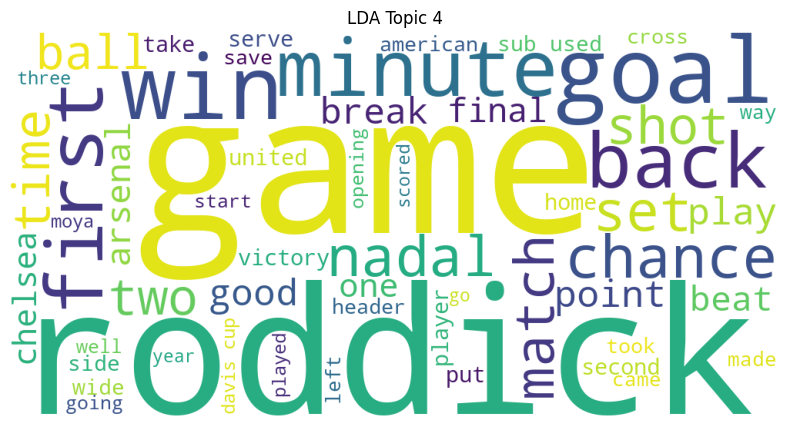

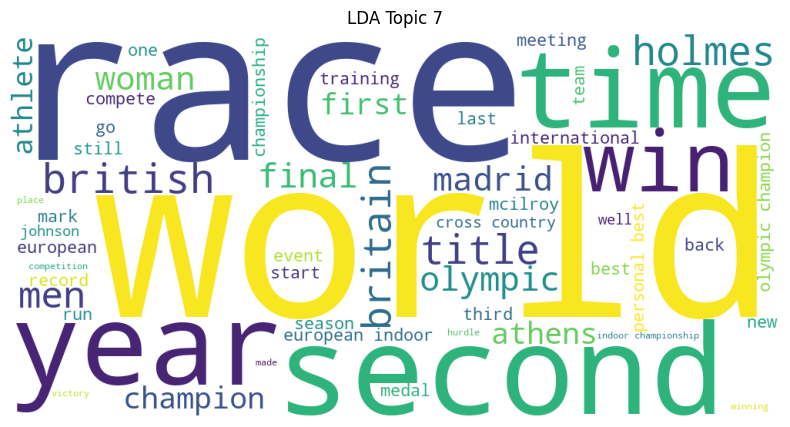

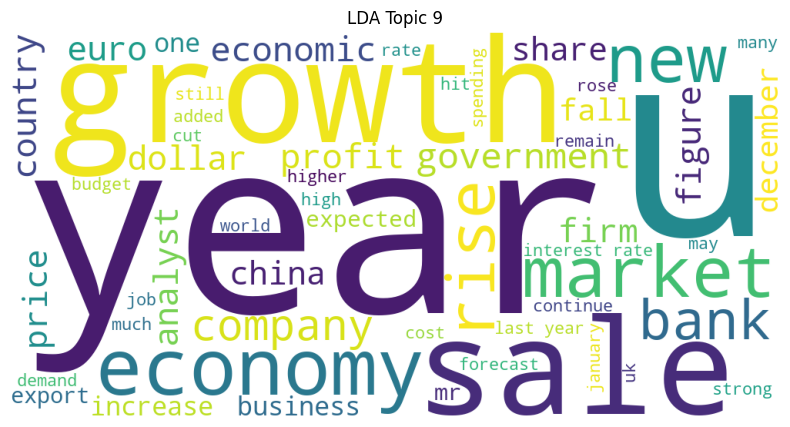

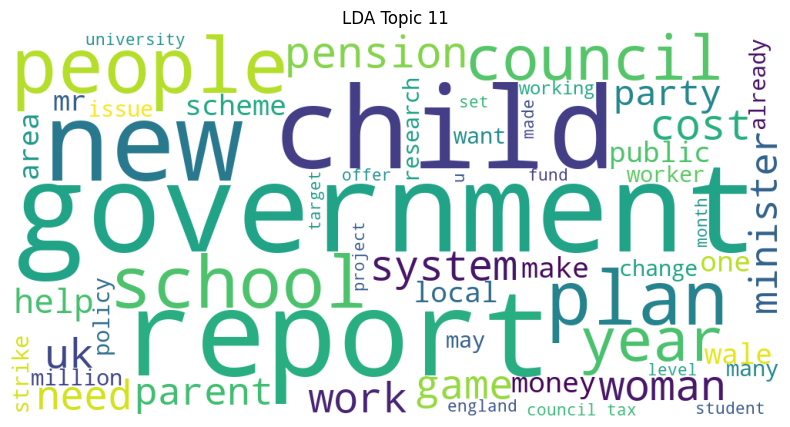

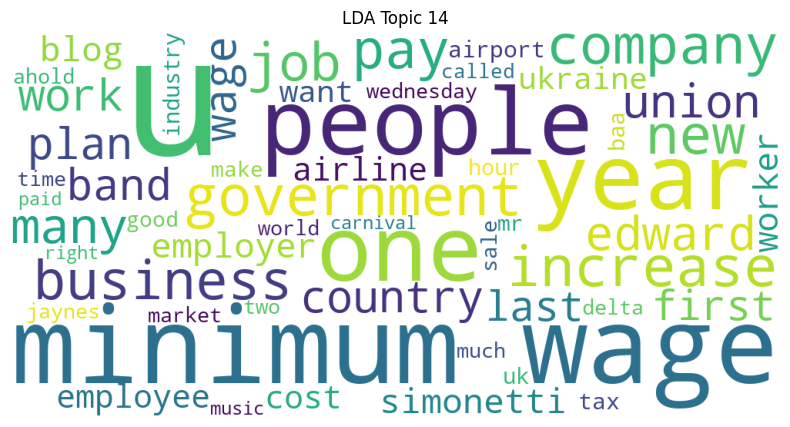

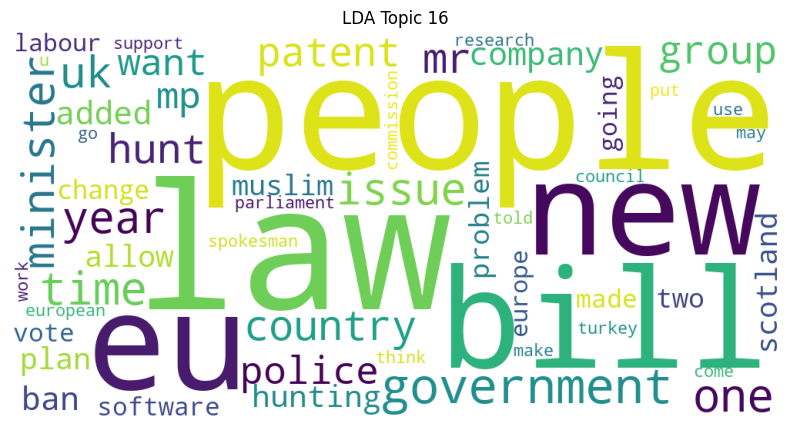

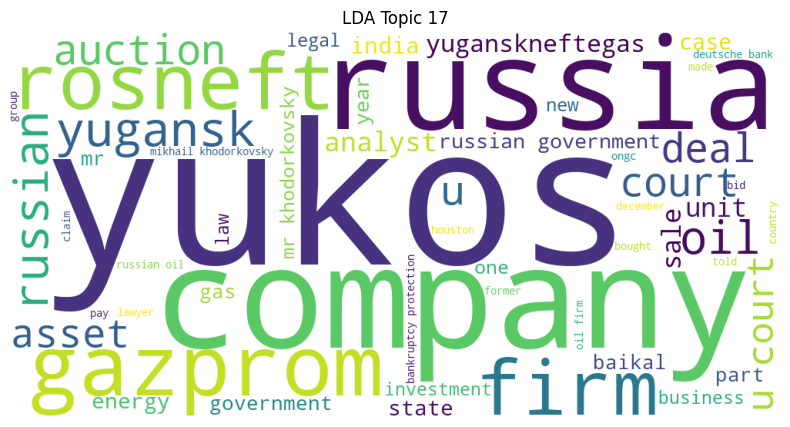

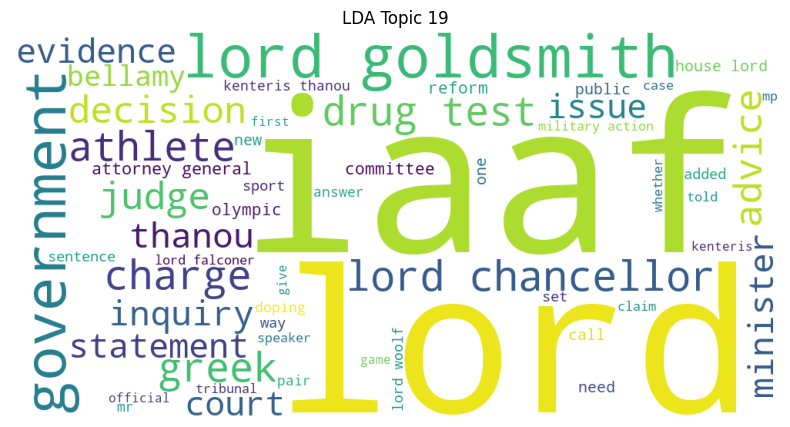

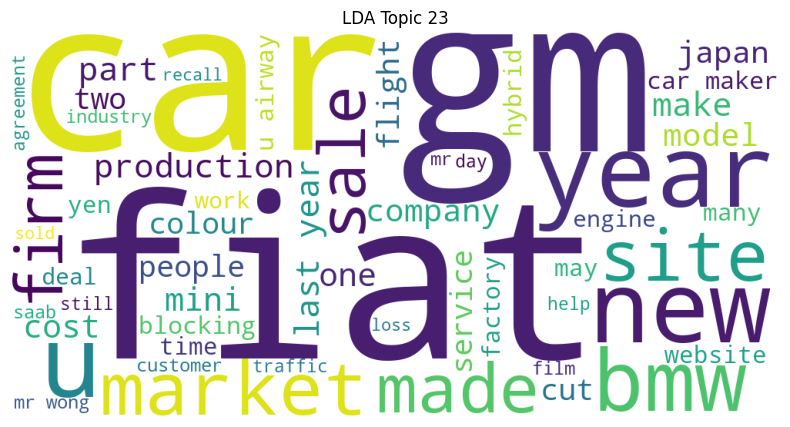

In [439]:
ids = [4, 7, 9, 11, 14, 16, 17, 19, 23] 

for topic_id in ids:
    topic_texts = data[data['lda_cluster'] == topic_id]['text'] 
    wordcloud_image = draw_wordcloud(topic_texts, max_words=55) 
    plt.figure(figsize=(10, 5)) 
    plt.imshow(wordcloud_image)
    plt.title(f'LDA Topic {topic_id}')
    plt.axis('off')
    plt.show() 

Получились ли темы более узкими от такого нововведения? Постройте облака тегов для нескольких наиболее удачных тем.

**Ответ:** Да, темы явно получились более узкими в силу особенностей LDA - он моделирует каждый документ как смесь нескольких тем, поэтому улавливает больше смысловых контекстов. Появилось несколько узких и интересных тем - нашлись машины, нефть (и много РФ нефтяных компаний), отдельная про зп, социальную политику, спорт поделился на национальное и мировое (как и политика в целом)

## Часть 3. Transfer learning и Self-Supervised Learning для задачи классификации текстов

**Задание 3.1 (0.5 балла).** Вспомним, что у нас есть разметка для тематик статей. Попробуем обучить классификатор поверх unsupervised-представлений для текстов. Рассмотрите три модели:

* Логистическая регрессия на tf-idf признаках
* K-Means на tf-idf признаках + логистическая регрессия на расстояниях до центров кластеров
* Латентное размещение Дирихле + логистическая регрессия на вероятностях тем

Разделите выборку на обучающую и тестовую, замерьте accuracy на обоих выборках для всех трех моделей. Параметры всех моделей возьмите равными значениям по умолчанию.

In [440]:
from sklearn.model_selection import train_test_split

X = data['text'] 
y = data['category'] 
X_train_text, X_test_text, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

In [441]:
tfidf_vectorizer = TfidfVectorizer(stop_words='english', min_df=3, ngram_range=(1, 1))
X_train_tfidf = tfidf_vectorizer.fit_transform(X_train_text)
X_test_tfidf = tfidf_vectorizer.transform(X_test_text)
print(f"TF-IDF matrix shape (train): {X_train_tfidf.shape}")
print(f"TF-IDF matrix shape (test): {X_test_tfidf.shape}")

TF-IDF matrix shape (train): (1780, 9530)
TF-IDF matrix shape (test): (445, 9530)


In [442]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score

lr_tfidf = LogisticRegression(max_iter=1000, random_state=42)
lr_tfidf.fit(X_train_tfidf, y_train)
y_pred_train_tfidf = lr_tfidf.predict(X_train_tfidf)
y_pred_test_tfidf = lr_tfidf.predict(X_test_tfidf)
acc_train_tfidf = accuracy_score(y_train, y_pred_train_tfidf)
acc_test_tfidf = accuracy_score(y_test, y_pred_test_tfidf)
print(f"Model 1 Accuracy (Logreg on TF-IDF): Train={acc_train_tfidf:.4f}, Test={acc_test_tfidf:.4f}")

Model 1 Accuracy (Logreg on TF-IDF): Train=0.9961, Test=0.9865


In [443]:
kmeans = KMeans(n_clusters=8, random_state=42, n_init='auto')
kmeans.fit(X_train_tfidf)
X_train_kmeans_dist = kmeans.transform(X_train_tfidf)
X_test_kmeans_dist = kmeans.transform(X_test_tfidf)

lr_kmeans_dist = LogisticRegression(max_iter=1000, random_state=42)
lr_kmeans_dist.fit(X_train_kmeans_dist, y_train)
y_pred_train_kmeans_dist = lr_kmeans_dist.predict(X_train_kmeans_dist)
y_pred_test_kmeans_dist = lr_kmeans_dist.predict(X_test_kmeans_dist)
acc_train_kmeans_dist = accuracy_score(y_train, y_pred_train_kmeans_dist)
acc_test_kmeans_dist = accuracy_score(y_test, y_pred_test_kmeans_dist)
print(f"Model 2 Accuracy (Logreg on KMeans distances): Train={acc_train_kmeans_dist:.4f}, Test={acc_test_kmeans_dist:.4f}")

Model 2 Accuracy (Logreg on KMeans distances): Train=0.8197, Test=0.8202


In [444]:
bow_vectorizer = CountVectorizer(min_df=3, ngram_range=(1, 1)) 
X_train_bow = bow_vectorizer.fit_transform(X_train_text)
X_test_bow = bow_vectorizer.transform(X_test_text) 

lda = LatentDirichletAllocation(n_components=24,random_state=42)

lda.fit(X_train_bow)
X_train_lda_topics = lda.transform(X_train_bow)
X_test_lda_topics = lda.transform(X_test_bow)
lr_lda = LogisticRegression(random_state=42, max_iter=1000)
lr_lda.fit(X_train_lda_topics, y_train)
y_pred_train_lda = lr_lda.predict(X_train_lda_topics)
y_pred_test_lda = lr_lda.predict(X_test_lda_topics)
acc_train_lda = accuracy_score(y_train, y_pred_train_lda)
acc_test_lda = accuracy_score(y_test, y_pred_test_lda)
print(f"Model 3 Accuracy (LDA Topics): Train={acc_train_lda:.4f}, Test={acc_test_lda:.4f}")

Model 3 Accuracy (LDA Topics): Train=0.9039, Test=0.9596


У какой модели получилось лучшее качество? С чем это связано?

**Ответ:** Лучшее качество получилось у первой модели. Это вероятно можно объяснить тем, что логрег на tfidf обучается с учителем на самом содержании текста, а в моделях 2 и 3 логрег учится на сгенерированных unsupervised признаках, которые ищут внутреннюю структуру, которые видимо менее точно отражают тексты. Кстати, этим еще можно объяснить, почему у модели 3 скор выше (и ближе к 1), чем у 2 - kmeans только выделяет кластеры, а lda сохраняет темы документов в большей степени 

**Задание 3.2 (1.5 балла).** Теперь просимулируем ситуацию слабой разметки, которая часто встречается в реальных данных. Разделим обучающую выборку в пропорции 5:65:30. Будем называть части, соответственно, размеченный трейн, неразмеченный трейн и валидация.

Все unsupervised-алгоритмы (векторайзеры и алгоритмы кластеризации) запускайте на всем трейне целиком (размеченном и неразмеченном, суммарно 70%), а итоговый классификатор обучайте только на размеченном трейне (5%). Подберите гиперпараметры моделей по качеству на валидации (30%), а затем оцените качество на тестовой выборке (которая осталась от прошлого задания). Не скромничайте при подборе числа кластеров, сейчас нас интересует не интерпретируемое разбиение выборки, а итоговое качество классификации.

In [445]:
X_train_full_text, X_val_text, y_train_full, y_val = train_test_split(X_train_text, y_train, test_size=0.3, random_state=42, stratify=y_train)
labeled_size_fraction = 0.05/0.7
X_train_unlabeled_text, X_train_labeled_text, _, y_train_labeled = train_test_split(X_train_full_text, y_train_full,test_size=labeled_size_fraction,random_state=42,stratify=y_train_full)

In [446]:
import optuna

def objective_kmeans(trial):
    tfidf_min_df = trial.suggest_int('tfidf_min_df', 2, 5)
    tfidf_max_df = trial.suggest_float('tfidf_max_df', 0.5, 0.95)
    tfidf_ngram_lower = trial.suggest_int('tfidf_ngram_lower', 1, 1)
    tfidf_ngram_upper = trial.suggest_int('tfidf_ngram_upper', tfidf_ngram_lower, 2)

    vectorizer = TfidfVectorizer(
        stop_words='english',
        min_df=tfidf_min_df,
        max_df=tfidf_max_df,
        ngram_range=(tfidf_ngram_lower, tfidf_ngram_upper)
    )

    X_train_full_tfidf = vectorizer.fit_transform(X_train_full_text)
    X_train_labeled_tfidf = vectorizer.transform(X_train_labeled_text)
    X_val_tfidf = vectorizer.transform(X_val_text)

    n_clusters = trial.suggest_int('n_clusters', 8, 700) 
    kmeans = KMeans(n_clusters=n_clusters, random_state=42, n_init='auto')
    kmeans.fit(X_train_full_tfidf)

    X_train_labeled_dist = kmeans.transform(X_train_labeled_tfidf)
    X_val_dist = kmeans.transform(X_val_tfidf)

    logreg_C = trial.suggest_float("logreg_C_kmeans", 1, 250) 
    classifier = LogisticRegression(random_state=42, max_iter=1000, C=logreg_C)
    classifier.fit(X_train_labeled_dist, y_train_labeled)

    y_pred_val = classifier.predict(X_val_dist)
    accuracy = accuracy_score(y_val, y_pred_val)
    return accuracy

study_kmeans = optuna.create_study(direction='maximize')
study_kmeans.optimize(objective_kmeans, n_trials=100, show_progress_bar=True)
best_params_kmeans = study_kmeans.best_params
best_accuracy_kmeans = study_kmeans.best_value
print(f"Best validation accuracy for Model 2: {best_accuracy_kmeans:.4f}")
print(f"Best params for Model 2: {best_params_kmeans}")

Best trial: 73. Best value: 0.960674: 100%|██████████| 100/100 [02:44<00:00,  1.65s/it]

Best validation accuracy for Model 2: 0.9607
Best params for Model 2: {'tfidf_min_df': 2, 'tfidf_max_df': 0.826257531573333, 'tfidf_ngram_lower': 1, 'tfidf_ngram_upper': 2, 'n_clusters': 555, 'logreg_C_kmeans': 229.004810105494}


In [447]:
def objective_lda(trial):
    bow_min_df = trial.suggest_int('bow_min_df', 2, 10)
    bow_max_df = trial.suggest_float('bow_max_df', 0.6, 0.95)
    bow_ngram_lower = trial.suggest_int('bow_ngram_lower', 1, 1)
    bow_ngram_upper = trial.suggest_int('bow_ngram_upper', bow_ngram_lower, 2)

    vectorizer = CountVectorizer(
        stop_words='english',
        min_df=bow_min_df,
        max_df=bow_max_df,
        ngram_range=(bow_ngram_lower, bow_ngram_upper)
    )
    X_train_full_bow = vectorizer.fit_transform(X_train_full_text)
    X_train_labeled_bow = vectorizer.transform(X_train_labeled_text)
    X_val_bow = vectorizer.transform(X_val_text)

    n_components = trial.suggest_int('n_components', 10, 50) 
    lda = LatentDirichletAllocation(n_components=n_components,random_state=42)
    lda.fit(X_train_full_bow)
    X_train_labeled_topics = lda.transform(X_train_labeled_bow)
    X_val_topics = lda.transform(X_val_bow)

    logreg_C = trial.suggest_float("logreg_C_lda", 0.001, 250) 
    classifier = LogisticRegression(random_state=42, C=logreg_C)
    classifier.fit(X_train_labeled_topics, y_train_labeled)

    y_pred_val = classifier.predict(X_val_topics)
    accuracy = accuracy_score(y_val, y_pred_val)
    return accuracy

study_lda = optuna.create_study(direction='maximize')
study_lda.optimize(objective_lda, n_trials=100, show_progress_bar=True)
best_params_lda = study_lda.best_params
best_accuracy_lda = study_lda.best_value
print(f"Best validation accuracy for Model 3: {best_accuracy_lda:.4f}")
print(f"Best params for Model 3: {best_params_lda}")

Best trial: 5. Best value: 0.964419: 100%|██████████| 100/100 [05:36<00:00,  3.36s/it]

Best validation accuracy for Model 3: 0.9644
Best params for Model 3: {'bow_min_df': 8, 'bow_max_df': 0.6693943714248641, 'bow_ngram_lower': 1, 'bow_ngram_upper': 2, 'n_components': 10, 'logreg_C_lda': 99.36483583183785}


In [448]:
def objective_tfidf_logreg(trial):
    tfidf_min_df = trial.suggest_int('tfidf_min_df', 2, 5)
    tfidf_max_df = trial.suggest_float('tfidf_max_df', 0.5, 0.95)
    tfidf_ngram_lower = trial.suggest_int('tfidf_ngram_lower', 1, 1) 
    tfidf_ngram_upper = trial.suggest_int('tfidf_ngram_upper', tfidf_ngram_lower, 2) 

    vectorizer = TfidfVectorizer(
        stop_words='english',
        min_df=tfidf_min_df,
        max_df=tfidf_max_df,
        ngram_range=(tfidf_ngram_lower, tfidf_ngram_upper)
    )
    vectorizer.fit(X_train_full_text)

    X_train_labeled_tfidf = vectorizer.transform(X_train_labeled_text)
    X_val_tfidf = vectorizer.transform(X_val_text)

    logreg_C = trial.suggest_float("logreg_C", 0.001, 250) 
    classifier = LogisticRegression(random_state=42, C=logreg_C)
    classifier.fit(X_train_labeled_tfidf, y_train_labeled)

    y_pred_val = classifier.predict(X_val_tfidf)
    accuracy = accuracy_score(y_val, y_pred_val)
    return accuracy

study_tfidf_logreg = optuna.create_study(direction='maximize')
study_tfidf_logreg.optimize(objective_tfidf_logreg, n_trials=100, show_progress_bar=True)
best_params_tfidf_logreg = study_tfidf_logreg.best_params
best_accuracy_tfidf_logreg = study_tfidf_logreg.best_value
print(f"Best validation accuracy for Model 1: {best_accuracy_tfidf_logreg:.4f}")
print(f"Best params for Model 1: {best_params_tfidf_logreg}")

Best trial: 47. Best value: 0.906367: 100%|██████████| 100/100 [00:34<00:00,  2.92it/s]

Best validation accuracy for Model 1: 0.9064
Best params for Model 1: {'tfidf_min_df': 4, 'tfidf_max_df': 0.5507110610091703, 'tfidf_ngram_lower': 1, 'tfidf_ngram_upper': 2, 'logreg_C': 192.38252565342486}


In [449]:
best_tfidf_vectorizer = TfidfVectorizer(
    stop_words='english',
    min_df=best_params_tfidf_logreg['tfidf_min_df'],
    max_df=best_params_tfidf_logreg['tfidf_max_df'],
    ngram_range=(best_params_tfidf_logreg['tfidf_ngram_lower'], best_params_tfidf_logreg['tfidf_ngram_upper'])
)

best_tfidf_vectorizer.fit(X_train_full_text)
X_train_labeled_final_tfidf = best_tfidf_vectorizer.transform(X_train_labeled_text)
X_test_final_tfidf = best_tfidf_vectorizer.transform(X_test_text)

final_logreg_model1 = LogisticRegression(random_state=42, C=best_params_tfidf_logreg['logreg_C'])
final_logreg_model1.fit(X_train_labeled_final_tfidf, y_train_labeled)
y_pred_test_model1 = final_logreg_model1.predict(X_test_final_tfidf)
acc_test_model1 = accuracy_score(y_test, y_pred_test_model1)
print(f"Model 1 Final Test Accuracy: {acc_test_model1:.4f}")

Model 1 Final Test Accuracy: 0.9236


In [450]:
best_tfidf_vectorizer_m2 = TfidfVectorizer(
    stop_words='english',
    min_df=best_params_kmeans['tfidf_min_df'],
    max_df=best_params_kmeans['tfidf_max_df'],
    ngram_range=(best_params_kmeans['tfidf_ngram_lower'], best_params_kmeans['tfidf_ngram_upper'])
)
X_train_full_final_tfidf_m2 = best_tfidf_vectorizer_m2.fit_transform(X_train_full_text) 
X_train_labeled_final_tfidf_m2 = best_tfidf_vectorizer_m2.transform(X_train_labeled_text)
X_test_final_tfidf_m2 = best_tfidf_vectorizer_m2.transform(X_test_text)

best_kmeans = KMeans(n_clusters=best_params_kmeans['n_clusters'],random_state=42)
best_kmeans.fit(X_train_full_final_tfidf_m2) 
X_train_labeled_final_dist_m2 = best_kmeans.transform(X_train_labeled_final_tfidf_m2)
X_test_final_dist_m2 = best_kmeans.transform(X_test_final_tfidf_m2)
final_logreg_model2 = LogisticRegression(random_state=42,C=best_params_kmeans['logreg_C_kmeans'])
final_logreg_model2.fit(X_train_labeled_final_dist_m2, y_train_labeled)

y_pred_test_model2 = final_logreg_model2.predict(X_test_final_dist_m2)
acc_test_model2 = accuracy_score(y_test, y_pred_test_model2)
print(f"Model 2 Final Test Accuracy: {acc_test_model2:.4f}")

Model 2 Final Test Accuracy: 0.9618


/Users/polina/b2b_reccomendation_systems/.venv/lib/python3.13/site-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [451]:
best_bow_vectorizer_m3 = CountVectorizer(
    stop_words='english',
    min_df=best_params_lda['bow_min_df'],
    max_df=best_params_lda['bow_max_df'],
    ngram_range=(best_params_lda['bow_ngram_lower'], best_params_lda['bow_ngram_upper'])
)
X_train_full_final_bow_m3 = best_bow_vectorizer_m3.fit_transform(X_train_full_text) 
X_train_labeled_final_bow_m3 = best_bow_vectorizer_m3.transform(X_train_labeled_text)
X_test_final_bow_m3 = best_bow_vectorizer_m3.transform(X_test_text)

best_lda = LatentDirichletAllocation(n_components=best_params_lda['n_components'],random_state=42)
best_lda.fit(X_train_full_final_bow_m3) 
X_train_labeled_final_topics_m3 = best_lda.transform(X_train_labeled_final_bow_m3)
X_test_final_topics_m3 = best_lda.transform(X_test_final_bow_m3)

final_logreg_model3 = LogisticRegression(random_state=42,C=best_params_lda['logreg_C_lda'])
final_logreg_model3.fit(X_train_labeled_final_topics_m3, y_train_labeled)
y_pred_test_model3 = final_logreg_model3.predict(X_test_final_topics_m3)
acc_test_model3 = accuracy_score(y_test, y_pred_test_model3)
print(f"Model 3 Final Test Accuracy: {acc_test_model3:.4f}")

Model 3 Final Test Accuracy: 0.9640


Как изменились результаты по сравнению с обучением на полной разметке? Сделайте выводы.

**Ответ:** Результаты поменялись достаточно сильно. В ситуации слабой разметки первая модель показывает наихудший результат. Логрег на расстояниях до центров кластеров дает заметно более лучший результат (ну и с огромным числом кластеров, на самом деле). LDA подбором выделяет чуть большее число компонент, скор немного подрос. В общем и целом, получилось ровно обратное распределение результатов, по сравнению с обучением на полной разметке

## Бонус

**Задание 4 (0.5 балла)**. Разберитесь с semi-supervised методами, которые реализованы в `sklearn` и примените их к заданию 3.2. Получилось ли добиться лучшего качества? Сделайте выводы.

In [452]:
from sklearn.semi_supervised import LabelPropagation, LabelSpreading, SelfTrainingClassifier
from sklearn.preprocessing import LabelEncoder

le = LabelEncoder()
le.fit(data['category'])
y_train_labeled_encoded = le.transform(y_train_labeled)
y_test_encoded = le.transform(y_test)

tfidf_vectorizer = TfidfVectorizer(
    stop_words='english',
    min_df=best_params_kmeans['tfidf_min_df'],
    max_df=best_params_kmeans['tfidf_max_df'],
    ngram_range=(best_params_kmeans['tfidf_ngram_lower'], best_params_kmeans['tfidf_ngram_upper'])
)

X_train_full_text_new = pd.concat([X_train_labeled_text, X_train_unlabeled_text], ignore_index=True)
X_train_full_tfidf_new = tfidf_vectorizer.fit_transform(X_train_full_text_new)
labels_for_ssl = np.concatenate([y_train_labeled_encoded, np.full(len(X_train_unlabeled_text), -1)])

lp_model = LabelPropagation(kernel='knn', n_neighbors=17) 
lp_model.fit(X_train_full_tfidf_new, labels_for_ssl)

X_test_final_tfidf_m2 = tfidf_vectorizer.transform(X_test_text)
y_pred_test_lp = lp_model.predict(X_test_final_tfidf_m2)
acc_test_lp = accuracy_score(y_test_encoded, y_pred_test_lp)
print(f"Label Propagation Test Accuracy: {acc_test_lp:.4f}")

Label Propagation Test Accuracy: 0.9303


In [453]:
ls_model = LabelSpreading(kernel='knn', n_neighbors=17, alpha=0.8, max_iter=1000) 

ls_model.fit(X_train_full_tfidf_new, labels_for_ssl)

y_pred_test_ls = ls_model.predict(X_test_final_tfidf_m2)
acc_test_ls = accuracy_score(y_test_encoded, y_pred_test_ls)
print(f"Label Spreading Test Accuracy: {acc_test_ls:.4f}")

Label Spreading Test Accuracy: 0.9528


In [454]:
from sklearn.svm import SVC

best_tfidf_vectorizer = TfidfVectorizer(
    stop_words='english',
    min_df=best_params_tfidf_logreg['tfidf_min_df'],
    max_df=best_params_tfidf_logreg['tfidf_max_df'],
    ngram_range=(best_params_tfidf_logreg['tfidf_ngram_lower'], best_params_tfidf_logreg['tfidf_ngram_upper'])
)

best_tfidf_vectorizer.fit(X_train_full_text)
X_train_full_tfidf_new = best_tfidf_vectorizer.fit_transform(X_train_full_text_new)
X_train_labeled_final_tfidf = best_tfidf_vectorizer.transform(X_train_labeled_text)
X_test_final_tfidf = best_tfidf_vectorizer.transform(X_test_text)

stc = SelfTrainingClassifier(estimator=SVC(probability=True, random_state=42, C = 89),
                             threshold=0.5)
stc.fit(X_train_full_tfidf_new, labels_for_ssl)

y_pred_test_stc = stc.predict(X_test_final_tfidf)
acc_test_stc = accuracy_score(y_test_encoded, y_pred_test_stc)
print(f"Self-Training Test Accuracy: {acc_test_stc:.4f}")

Self-Training Test Accuracy: 0.9618


По сравнению с заданием 3.2 получилось добиться качества только такого же (SelfTrainingClassifier)- все еще ниже, чем модель 1 на полной разметке, но в условиях неполной разметки получилось хорошо (через optuna почему то плохо подбирается)

**Задание 5 (1 балл)**. На занятиях мы обсуждали, что метрика [BCubed](https://www.researchgate.net/profile/Julio-Gonzalo-2/publication/225548032_Amigo_E_Gonzalo_J_Artiles_J_et_alA_comparison_of_extrinsic_clustering_evaluation_metrics_based_on_formal_constraints_Inform_Retriev_12461-486/links/0c96052138dbb99740000000/Amigo-E-Gonzalo-J-Artiles-J-et-alA-comparison-of-extrinsic-clustering-evaluation-metrics-based-on-formal-constraints-Inform-Retriev-12461-486.pdf) хорошо подходит для сравнения алгоритмов кластеризации, если нам известно настоящее разделение на кластеры (gold standard). Реализуйте подсчет метрики BCubed и сравните несколько алгоритмов кластеризации на текстовых данных из основного задания. В качестве gold standard используйте разметку category.

In [455]:
def bcubed_score(labels_true, labels_pred):
    n_samples = len(labels_true)
    precision_sum = 0.0
    recall_sum = 0.0

    items_in_pred_cluster = {}
    items_in_true_class = {}

    for i in range(n_samples):
        pred_label = labels_pred[i]
        true_label = labels_true[i]
        if pred_label not in items_in_pred_cluster:
            items_in_pred_cluster[pred_label] = np.where(labels_pred == pred_label)[0]
        cluster_indices = items_in_pred_cluster[pred_label]

        precision_num = 0
        precision_den = len(cluster_indices)
        if precision_den > 0:
            for j in cluster_indices:
                if labels_true[j] == true_label:
                    precision_num += 1
            precision_sum += precision_num / precision_den
        else: 
             precision_sum += 1.0

        if true_label not in items_in_true_class:
             items_in_true_class[true_label] = np.where(labels_true == true_label)[0]
        class_indices = items_in_true_class[true_label]
        
        recall_num = 0
        recall_den = len(class_indices)
        if recall_den > 0:
             for j in class_indices:
                  if labels_pred[j] == pred_label:
                       recall_num += 1
             recall_sum += recall_num / recall_den
        else: 
             recall_sum += 1.0


    precision = precision_sum / n_samples
    recall = recall_sum / n_samples
    if precision + recall == 0:
        f1 = 0.0
    else:
        f1 = 2 * (precision * recall) / (precision + recall)
    return precision, recall, f1

In [456]:
le = LabelEncoder()
labels_true_encoded = le.fit_transform(data['category'])
n_true_classes = len(le.classes_)

tfidf_vectorizer_full = TfidfVectorizer(stop_words='english', min_df=3, ngram_range=(1, 2), max_df=0.6)
tfidf_matrix_full = tfidf_vectorizer_full.fit_transform(data['text'])

bow_vectorizer_full = CountVectorizer(max_df=0.6, min_df=9, ngram_range=(1, 2))
bow_matrix_full = bow_vectorizer_full.fit_transform(data['text'])

In [457]:
results = {} 

kmeans_final = KMeans(n_clusters=n_true_classes, random_state=42)
labels_kmeans = kmeans_final.fit_predict(tfidf_matrix_full)
results['KMeans'] = bcubed_score(labels_true_encoded, labels_kmeans)
print("KMeans BCubed:", results['KMeans'])


spectral_final = SpectralClustering(n_clusters=n_true_classes,affinity='nearest_neighbors',n_neighbors=10, random_state=42)
labels_spectral = spectral_final.fit_predict(tfidf_matrix_full)
results['Spectral'] = bcubed_score(labels_true_encoded, labels_spectral)
print("Spectral BCubed:", results['Spectral'])

KMeans BCubed: (0.6806101852012953, 0.7430427638078654, 0.7104575218837264)
Spectral BCubed: (0.4159645100396201, 0.8517491908754625, 0.5589549668878859)


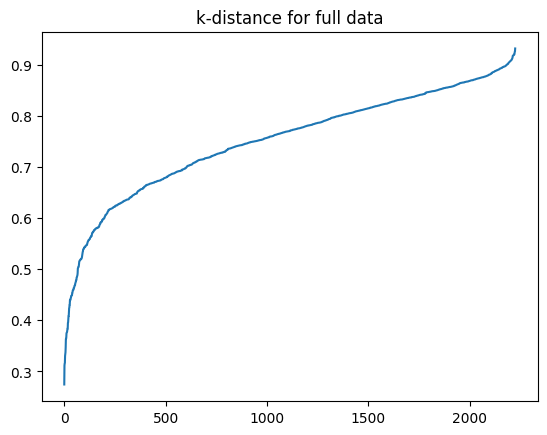

In [458]:
min_samples_dbscan = 5
nn = NearestNeighbors(n_neighbors=min_samples_dbscan, metric='cosine')
nn.fit(tfidf_matrix_full)
distances, _ = nn.kneighbors(tfidf_matrix_full)
k_distances = distances[:, min_samples_dbscan - 1]
k_distances_sorted = np.sort(k_distances)
plt.plot(k_distances_sorted)
plt.title('k-distance for full data')
plt.show() 

In [459]:
eps_dbscan = 0.7 
dbscan_final = DBSCAN(eps=eps_dbscan, min_samples=min_samples_dbscan, metric='cosine', n_jobs=-1)
labels_dbscan = dbscan_final.fit_predict(tfidf_matrix_full)
mask_non_noise = labels_dbscan != -1

results['DBSCAN'] = bcubed_score(labels_true_encoded[mask_non_noise], labels_dbscan[mask_non_noise])
print("DBSCAN BCubed (non-noise points):", results['DBSCAN'])
print(f"  Number of noise points: {np.sum(~mask_non_noise)}")

DBSCAN BCubed (non-noise points): (0.9608201818381003, 0.1853379687984028, 0.3107362815218707)
  Number of noise points: 1289


In [460]:
n_components_lda_clust = n_true_classes * 2 
lda_final = LatentDirichletAllocation(n_components=n_components_lda_clust, 
                                      learning_method='batch',
                                      random_state=42, n_jobs=-1)
lda_final.fit(bow_matrix_full)
doc_topic_distr_full = lda_final.transform(bow_matrix_full)
labels_lda = np.argmax(doc_topic_distr_full, axis=1)
results['LDA (argmax topic)'] = bcubed_score(labels_true_encoded, labels_lda)
print("LDA BCubed:", results['LDA (argmax topic)'])

LDA BCubed: (0.8057438632135582, 0.5218377216625476, 0.6334338267612865)


In [461]:
res = pd.DataFrame(results)
res

,KMeans,Spectral,DBSCAN,LDA (argmax topic)
0,0.680610,0.415965,0.960820,0.805744
1,0.743043,0.851749,0.185338,0.521838
2,0.710458,0.558955,0.310736,0.633434


По F1 (3 я строка) лучший результат у KMeans, дальше идет LDA

**Задание 6 (2 баллa)**. Спектральная кластеризация, по сути, является обычной кластеризацией KMeans поверх эмбеддингов объектов, которые получаются из лапласиана графа. А что, если мы попробуем построить эмбеддинги каким-нибудь другим способом? В этом задании мы предлагаем вам проявить немного фантазии. Возьмите какие-нибудь данные высокой размерности, чтобы задача обучения эмбеддингов имела смысл (например, картинки или тексты, желательно выбрать что-нибудь оригинальное). Придумайте или найдите какой-нибудь метод обучения эмбеддингов, примените его к данным и кластеризуйте полученные представления. Если чувствуете в себе достаточно силы, можете попробовать что-нибудь нейросетевое. Сравните ваш подход с базовыми алгоритмами кластеризации, которое мы рассмотрели в основном задании, не забывайте про визуализации! Ключевые слова для вдохновения: ***KernelPCA***, ***UMAP***, ***autoencoders***, ***gensim***.

In [462]:
# YOUR CODE HERE ‿︵‿︵ヽ(°□° )ノ︵‿︵‿

**Задание 7 (1 балл)**. Наконец, ставший ежегодной традицией социализационный бонус. Мы поощряем не только предметное, но и духовное развитие. Поэтому, чтобы заработать балл за это задание, сходите на какую-нибудь выставку, в музей, театр, или наконец в церковь, напишите небольшой отчетик о ваших впечатлениях и добавьте фотопруфы в ноутбук при сдаче. Можете объединиться с одногруппниками/однокурсниками, а также пригласить ассистентов/преподавателей, они тоже будут рады выбраться куда-нибудь. Для вдохновения приведем ссылку на актуальные выставки [новой](https://www.youtube.com/watch?v=dQw4w9WgXcQ&ab) и [старой Третьяковки](https://www.youtube.com/watch?v=xm3YgoEiEDc) (но совсем не обязательно посещать именно их).

In [463]:
# YOUR CODE HERE (ノಠ益ಠ)ノ彡┻━┻